<a href="https://colab.research.google.com/github/suresh-venkate/Code_Repositories/blob/main/Deep_Learning/Computer_Vision/Object_Localization/Datasets/Stanford_Cars_Dataset/Stanford_Cars_Dataset_Localization_Inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stanford Car Dataset Localization - Inference Only NB


# Connect to Google Drive

In [1]:
### Use this for Google Colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import required libraries

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import datetime
import os
import shutil
import pytz
import math
import cv2
import pprint
%matplotlib inline

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers, models, Model
from tensorflow.keras import optimizers, losses, metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Flatten, Dense, Activation, Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers.schedules import InverseTimeDecay 
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import apply_affine_transform
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import vgg16
from tensorflow.keras.applications import resnet50
from tensorflow.keras.applications import mobilenet
from tensorflow.keras.applications import inception_v3
from tensorflow.keras.applications import densenet

from tqdm import tqdm

import imgaug as ia
from imgaug import augmenters as iaa
from imgaug import parameters as iap
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug.augmentables.batches import Batch

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

# Define directory paths

In [3]:
# Define base path for storing all outputs related to model / training
out_base_path = "/content/drive/MyDrive/AI_ML_Folder/Colab_Directory/Model_Outputs/Stanford_Car_Dataset/Training_Outputs/"
os.makedirs(out_base_path, exist_ok = True) # Don't raise any exception if directory exists
# Define base path of dataset
dataset_path = "/content/drive/MyDrive/AI_ML_Folder/Colab_Directory/Datasets/Image_Datasets/Stanford_Car_Dataset/"

# Import dataset

In [4]:
# Copy dataset from Google Drive
img_zip_file_name = "Consolidated_Dataset.zip"
img_zip_file_path = os.path.join(dataset_path, img_zip_file_name)

# Get start time of run and display it
start_time = datetime.datetime.now(pytz.timezone('Asia/Kolkata'))
print("Started dataset copy at %s..." %(start_time.strftime("%H:%M:%S")), end = ' ')
!cp {img_zip_file_path} .

# Unzip dataset file
print("Unzipping dataset...")
!unzip -q Consolidated_Dataset.zip
# Delete zip file
!rm Consolidated_Dataset.zip

# Get end time of run and display elapsed time
end_time = datetime.datetime.now(pytz.timezone('Asia/Kolkata'))
elap_time = ((end_time - start_time).total_seconds())/60
print("Completed at %s. Elapsed time = %0.2f minutes." %(end_time.strftime("%H:%M:%S"), elap_time))

Started dataset copy at 09:34:12... Unzipping dataset...
Completed at 09:35:14. Elapsed time = 1.03 minutes.


# Load annotation files to Pandas Dataframes

In [5]:
# Load train annotation file in a DataFrame
ann_train_csv_path = './annot_train_cons.csv'
train_df = pd.read_csv(ann_train_csv_path)
display(train_df.head())

,filename,xmin,ymin,xmax,ymax,label,img_h,img_w,class
0,00001.jpg,39,116,569,375,14,400.0,600.0,Audi TTS Coupe 2012
1,00002.jpg,36,116,868,587,3,675.0,900.0,Acura TL Sedan 2012
2,00003.jpg,85,109,601,381,91,480.0,640.0,Dodge Dakota Club Cab 2007
3,00004.jpg,621,393,1484,1096,134,1386.0,2100.0,Hyundai Sonata Hybrid Sedan 2012
4,00005.jpg,14,36,133,99,106,108.0,144.0,Ford F-450 Super Duty Crew Cab 2012


In [6]:
# Load test annotation file in a DataFrame
ann_test_csv_path = './annot_test_cons.csv'
test_df = pd.read_csv(ann_test_csv_path)
display(test_df.head())

,filename,xmin,ymin,xmax,ymax,label,img_h,img_w,class
0,00001.jpg,30,52,246,147,181,182.0,276.0,Suzuki Aerio Sedan 2007
1,00002.jpg,100,19,576,203,103,360.0,640.0,Ferrari 458 Italia Convertible 2012
2,00003.jpg,51,105,968,659,145,741.0,1024.0,Jeep Patriot SUV 2012
3,00004.jpg,67,84,581,407,187,480.0,640.0,Toyota Camry Sedan 2012
4,00005.jpg,140,151,593,339,185,373.0,600.0,Tesla Model S Sedan 2012


In [7]:
train_img_path = '/content/train_images/'
test_img_path = '/content/test_images/'

# Define base model, target image shape and model batch size

In [8]:
### The base model defined here (bm_name) will be used to choose the appropriate pre-processing function
### to apply to the input images in the Image Data Generators

### If bm_name = 'VGG16' or 'ResNet50':
###    Only mean shift is applied
###    img_preprocessed = img - [103.939, 116.779, 123.68]
### If bm_name = 'MobileNet' or 'InceptionV3'
###    Image scaled to lie between -1 and +1
###    img_preprocessed = (img / 127.5) - 1
### If bm_name = 'grayscale_model'
###    Image scaled to lie between 0 and +1
###    img_preprocessed = (img / 225.)

# bm_name = 'VGG16'
# bm_name = 'ResNet50'
# bm_name = 'MobileNet'
# bm_name = 'InceptionV3'
bm_name = 'DenseNet'
# bm_name = 'grayscale_model'

# Define target image size and batch size 
mod_inp_shape = (224, 224, 3) # Define target image size for model input
mod_bat_size = 64 # Batch size to use while model fitting

# Define pre-processing function

In [9]:
# Define pre-processing and undo pre-processing function
# Appropriate pre-processing functions from Keras are used.

def preprocess_data(img):

  if (bm_name == 'VGG16'):
    return vgg16.preprocess_input(img)
  elif (bm_name == 'ResNet50'):
    return resnet50.preprocess_input(img)
  elif (bm_name == 'MobileNet'):
    return mobilenet.preprocess_input(img)
  elif (bm_name == 'InceptionV3'):
    return inception_v3.preprocess_input(img)
  elif (bm_name == 'DenseNet'):
    return densenet.preprocess_input(img)    
  elif (bm_name == 'grayscale_model'):
    return img/255.

def undo_preprocess_data(img, bm_name):

  if ((bm_name == 'VGG16') or (bm_name == 'ResNet50')):
    mean = [103.939, 116.779, 123.68]
    img[..., 0] += mean[0]
    img[..., 1] += mean[1]
    img[..., 2] += mean[2]
    img = img[..., ::-1].astype('uint8')
  elif ((bm_name == 'MobileNet') or (bm_name == 'InceptionV3')):
    img = ((img + 1) * 127.5).astype('uint8')
  elif ((bm_name == 'DenseNet')):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    img[..., 0] *= std[0]
    img[..., 1] *= std[1]
    img[..., 2] *= std[2]    
    img[..., 0] += mean[0]
    img[..., 1] += mean[1]
    img[..., 2] += mean[2]
    img = (img * 255.0).astype('uint8')     
  elif (bm_name == 'grayscale_model'):
    img = (img * 255.0).astype('uint8')

  return img

# Classes: Define batch generator class

In [10]:
class batch_generator_from_df(Sequence):
    
    def  __init__(self, df, directory, x_col, y_col, gen_bbox, batch_size, target_size, aug = False, shuffle = False,\
                  seed = 1234, preprocessing_function = None):
      self.df = df # Name of dataframe to read image information from
      self.samples = df.shape[0] # Placeholder to store number of images in dataframe
      self.directory = directory # Directory name to read images from
      self.x_col = x_col # Name of column in dataframe that contains image file names
      self.y_col = y_col # Name of column in dataframe that contains image class names
      self.gen_bbox = gen_bbox # Boolean: If True, bboxes should be included in target output
      self.batch_size = batch_size # Batch size to use for each batch
      self.target_size = target_size # Target image size
      self.image_shape = (self.target_size[0], self.target_size[1], 3) # Placeholder to store output 
                                                                       # image size
      self.aug = aug # Boolean: If True, augment images
      self.shuffle = shuffle # Boolen: If True, shuffle dataset at start of every epoch
      self.seed = seed # Random seed to use for shuffling
      self.preprocessing_function = preprocessing_function # Preprocessing function to apply to every image
      self.class_list = sorted(df[y_col].unique()) # Placeholder to store class list
      self.num_classes = len(self.class_list) # Placeholder to store number of classes
      # Placeholder to store class to index mapping
      self.class_indices = {value:ind for ind, value in enumerate(self.class_list)} 
      self.on_epoch_end()
      print(f"Found {self.samples} images belonging to {self.num_classes} classes")

    def __len__(self):
      return int(np.ceil(float(self.df.shape[0] / self.batch_size)))

    def __getitem__(self, index):

      ### Generate current batch from dataframe
      start_ind = index * self.batch_size # Start index of current batch
      end_ind = min((index + 1) * self.batch_size, self.df.shape[0]) # End index of current batch
      sub_df = self.df[start_ind:end_ind] # Create sub dataframe using start and end indices

      ### Define placeholders
      img_batch = [] # Placeholder to store images during processing
      y_batch = [] # Placeholder to store target values
      y_label = [] # Placeholder to store target labels 
      y_bbox = [] # Placeholder to store target BBOX co-ordinates
      bbs_batch = [] # Placeholder to store bbs values (required for imgaug)

      for _, row in sub_df.iterrows(): # Iterate through all rows in sub_df

        ### Update y_label  
        label = row[self.y_col] # Extract label of current row
        label_index = self.class_indices[label] # Convert label to label index
        label_ohe = to_categorical(label_index, num_classes = self.num_classes) # OHE label_index
        y_label.append(label_ohe) # Update y_label with current OHE label_index

        ### Update X_batch
        img_file_name = row[self.x_col] # Extract image file name of current row
        img_file_path = os.path.join(self.directory, img_file_name) # Obtain image file path
        img = cv2.imread(img_file_path) # Read image from disk
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert image to RGB
        img_batch.append(img) # Update img_batch with current image

        ### Update y_bbox and bbs_batch
        if (self.gen_bbox): # gen_bbox = True => Generate BBOX co-ordinates also for output
          # Get size and BBOX co-ordinates of original image
          img_width_orig = row['img_w'] # Width of original image
          img_height_orig = row['img_h'] # Height of original image
          xmin_orig = row['xmin'] # xmin co-ordinate of BBOX in original image
          ymin_orig = row['ymin'] # ymin co-ordinate of BBOX in original image
          xmax_orig = row['xmax'] # xmax co-ordinate of BBOX in original image
          ymax_orig = row['ymax'] # ymax co-ordinate of BBOX in original image
          # Generate bbs object from BBOX coordinates
          bbs = BoundingBoxesOnImage([BoundingBox(x1 = xmin_orig, y1 = ymin_orig, x2 = xmax_orig,\
                                                  y2 = ymax_orig)], shape=img.shape)
          # Append current bbs object to bbs_batch
          bbs_batch.append(bbs)  
          ### Generate normalized co-ordinates of original BBOX         
          xmin_norm = (xmin_orig / img_width_orig) # Normalized xmin co-ordinate
          ymin_norm = (ymin_orig / img_height_orig) # Normalized ymin co-ordinate
          xmax_norm = (xmax_orig / img_width_orig) # Normalized xmax co-ordinate
          ymax_norm = (ymax_orig / img_height_orig) # Normalized ymax co-ordinate
          # Append unaugmented BBOX co-ordinates to y_bbox
          y_bbox.append([xmin_norm, ymin_norm, xmax_norm, ymax_norm])

          
      ### Augment images and BBOXes
      if (self.aug): # aug = True => Augment images and BBOxes
        if (self.gen_bbox): # Augment both image and bounding box
          # Generate imgaug batch object with current batch of images and BBOXes
          img_bbox_batch = Batch(images = img_batch, bounding_boxes = bbs_batch)
          # Augment entire batch of images and BBOXes
          img_bbox_batch_aug = seq.augment_batch(img_bbox_batch)
          # Extract list of augmented images
          img_batch = img_bbox_batch_aug.images_aug
          # Extract list of augmented bbs objects
          bbs_aug_batch = img_bbox_batch_aug.bounding_boxes_aug
          bbs_aug_list = [] # Placeholder to store augmented bounding box coordinates
          for ind in range(len(bbs_aug_batch)): # Loop through all bbs objects in batch
            bbs_aug = bbs_aug_batch[ind] # Extract current bbs object
            bbs_aug_clip = bbs_aug.clip_out_of_image() # Clip current bbs object to image dimensions
            # Extract xy-coords of bbox and append to bbs_list
            bbs_aug_list.append(bbs_aug_clip.to_xyxy_array()[0]) 
          bbs_aug_arr = np.array(bbs_aug_list) # Convert bbs_aug_list to array
          y_bbox = bbs_aug_arr/bbs_aug.width # Normalize bbs_aug_arr and copy to y_bbox
        else: # Augment only images
          img_batch = seq.augment_images(images = img_batch)
      else: # aug = False => Only re-scale images and BBOXes
        if (self.gen_bbox): # Augment both image and bounding box
          # Generate imgaug batch object with current batch of images and BBOXes
          img_bbox_batch = Batch(images = img_batch, bounding_boxes = bbs_batch)
          # Augment entire batch of images and BBOXes
          img_bbox_batch_aug = seq_rescale.augment_batch(img_bbox_batch)
          # Extract list of augmented images
          img_batch = img_bbox_batch_aug.images_aug
          # Extract list of augmented bbs objects
          bbs_aug_batch = img_bbox_batch_aug.bounding_boxes_aug
          bbs_aug_list = [] # Placeholder to store augmented bounding box coordinates
          for ind in range(len(bbs_aug_batch)): # Loop through all bbs objects in batch
            bbs_aug = bbs_aug_batch[ind] # Extract current bbs object
            bbs_aug_clip = bbs_aug.clip_out_of_image() # Clip current bbs object to image dimensions
            # Extract xy-coords of bbox and append to bbs_list
            bbs_aug_list.append(bbs_aug_clip.to_xyxy_array()[0]) 
          bbs_aug_arr = np.array(bbs_aug_list) # Convert bbs_aug_list to array
          y_bbox = bbs_aug_arr/bbs_aug.width # Normalize bbs_aug_arr and copy to y_bbox
        else: # Augment only images
          img_batch = seq_rescale.augment_images(images = img_batch)
      
      ### Batch pre-processing of images
      img_batch = np.array(img_batch, dtype = np.float32) # Convert img_batch to array
      if (self.preprocessing_function != None): # preprocessing_function != None => Preprocess img_batch
        img_batch = self.preprocessing_function(img_batch)
      
      ### Generate final processed batch of images
      X_batch = img_batch
        
      ### Generate final processed labels
      y_label = np.array(y_label, dtype = np.float32)
      if (self.gen_bbox):
        y_bbox = np.array(y_bbox, dtype = np.float32)
        y_batch = [y_label, y_bbox]
      else:
        y_batch = y_label
        
      return X_batch, y_batch

    def on_epoch_end(self):
      if (self.shuffle): # If 'shuffle' = True, random shuffle the dataframe at the end of the epoch
        self.df = self.df.sample(frac = 1, random_state = self.seed).reset_index(drop = True)

# Define Generator Objects

In [11]:
# Define train, val and test generator objects
train_generator = batch_generator_from_df(train_df, train_img_path, 'filename', 'class', True,\
                                          mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                          preprocessing_function = preprocess_data)
test_generator = batch_generator_from_df(test_df, test_img_path, 'filename', 'class', True,\
                                         mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                         preprocessing_function = preprocess_data)

Found 8144 images belonging to 196 classes
Found 8041 images belonging to 196 classes


In [12]:
# Extract class-index mapping from train generator
class_ind_dict = train_generator.class_indices
# Create index-class mapping from class-index mapping
ind_class_dict = {value:ind for ind, value in class_ind_dict.items()}

for ind, class_val in ind_class_dict.items():
  if (ind < 10):
    print(f"Index: {ind}, Class: {class_val}")

Index: 0, Class: AM General Hummer SUV 2000
Index: 1, Class: Acura Integra Type R 2001
Index: 2, Class: Acura RL Sedan 2012
Index: 3, Class: Acura TL Sedan 2012
Index: 4, Class: Acura TL Type-S 2008
Index: 5, Class: Acura TSX Sedan 2012
Index: 6, Class: Acura ZDX Hatchback 2012
Index: 7, Class: Aston Martin V8 Vantage Convertible 2012
Index: 8, Class: Aston Martin V8 Vantage Coupe 2012
Index: 9, Class: Aston Martin Virage Convertible 2012


# IoU computation

In [13]:
def iou(box1, box2):
    
    """Implement the intersection over union (IoU) between box1 and box2
    
    Arguments:
    box1 -- first box, list object with coordinates (box1_x1, box1_y1, box1_x2, box_1_y2)
    box2 -- second box, list object with coordinates (box2_x1, box2_y1, box2_x2, box2_y2)
    """

    # Extract x, y co-ordinates of both boxes
    (box1_x1, box1_y1, box1_x2, box1_y2) = box1
    (box2_x1, box2_y1, box2_x2, box2_y2) = box2
    
    # Calculate the (xi1, yi1, xi2, yi2) coordinates of the intersection of box1 and box2. 
    # Calculate its Area.
    xi1 = max(box1_x1, box2_x1)
    yi1 = max(box1_y1, box2_y1)
    xi2 = min(box1_x2, box2_x2)
    yi2 = min(box1_y2, box2_y2)
    inter_width = max((xi2 - xi1),0)
    inter_height = max((yi2 - yi1),0)
    inter_area = inter_width * inter_height

    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1_y2 - box1_y1) * (box1_x2 - box1_x1)
    box2_area = (box2_y2 - box2_y1) * (box2_x2 - box2_x1)
    union_area = box1_area + box2_area - inter_area
    
    # compute the IoU
    iou = inter_area / union_area
    
    return iou

def calc_iou(y_true, y_pred):
  num_samp = y_true.shape[0]
  results = []
  for ind in range(y_true.shape[0]):
    box1 = y_true[ind].numpy().copy()
    box2 = y_pred[ind].numpy().copy()
    iou_samp = iou(box1, box2)
    results.append(iou_samp)
  mean_iou = np.mean(results)
  mean_iou = mean_iou.astype(np.float32)
  return mean_iou

def IoU(y_true, y_pred):
    return tf.py_function(calc_iou, [y_true, y_pred], tf.float32)    

# Set model_core, model_compile, model_train parameters

In [ ]:
# ### Define file paths
# mod_file_pref = "MB_01" # Prefix to use for naming files and paths
# tb_path = os.path.join(tb_logs_base_path, mod_file_pref) # Tensorboard base path
# fm_path = os.path.join(out_base_path, mod_file_pref + "_finalmodel.h5") # Final trained model path
# #mc_path = os.path.join(out_base_path, mod_file_pref + "_EP{epoch:04d}.h5") # Model checkpoints path
# mc_path = os.path.join("/content", mod_file_pref + ".h5") # Model checkpoints path
# hi_path = os.path.join(out_base_path, mod_file_pref + "_hist.npy") # Training history path

# # Set model_dict values
# model_dict = {'model_arch': 'B',
#               'mod_inp_shape': mod_inp_shape,
#               'weights': 'imagenet',
#               'trainable': True,
#               'dropout_rate': [0.4, 0.7, 0.0, 0.0, 0.2, 0.2, 0.1, 0.1],
#               'num_classes': num_classes
#               }
# # Set compile_dict values
# compile_dict = {'ilr': 5e-4, # Initial learning rate to use for learning rate decay scheduler    
#                 'dr': 1, # Decay rate to use for learning rate decay scheduler
#                 'ds': (len(train_generator) * 10), # Decay rate to use for learning rate decay scheduler
#                 'redlr_plat': True, # Boolean: If True, implement reduce LR on plateau  
#                 'loss_type': 'localization' # Set to 'classification' or 'localization'
#                }
# # Set train_dict values               
# train_dict = {'fit_resume': False, # Boolean: If True, resume fit from initial epoch
#               'load_model': False, # Boolean: If True, load model from 'fm_path' and resume fit
#               'recompile': False, # Boolean: If True, recompile model before resuming fit
#               'train_gen': train_generator, # Train generator to use while fitting
#               'val_gen': val_generator, # Validation generator to use while fitting
#               'epochs': 250, # Number of epochs to train for              
#               'initial_epoch': 0, # Initial epoch to start from              
#               'train_steps_per_epoch': len(train_generator), # No. of steps per epoch
#               'val_steps': len(val_generator), # No. of steps before stopping eval of val set
#               'val_freq': 1, # Number of epochs to run before performing a validation run
#               'verb': 1, # Controls verbosity level of model fit.
#               'mcp_freq': "epoch", # Checkpoint model after mcp_freq batches
#               'early_stop': True, # Boolean: If True, implement early stop
#               'redlr_plat': compile_dict['redlr_plat'], # Boolean: If True, implement reduce LR on plateau
#               'lrpl_fac': 0.2, # Factor to use for Reduce LR on Plateau callback
#               'lrpl_pat': 10, # Patience to use for Reduce LR on Plateau callback              
#               'tb_path': tb_path, # Path to store Tensorboard callback information
#               'mc_path': mc_path, # File name to use for storing model checkpoints
#               'fm_path': fm_path, # File name to use for storing final trained model
#               'hi_path': hi_path, # File name to use for storing training history
#               }

# print(tb_path)
# print(mc_path)
# print(fm_path)
# print(hi_path)

# Define Functions

## Function: get_model

In [14]:
def get_model(mod_file_prefix, best_model, custom_objects, print_summary = False):
  '''
  Function to return required paths, loaded model and print model summary

  Arguments:
    mod_file_prefix: # Prefix of model file name
    best_model: Boolean. If True, load best_model, else load final model
    print_summary: Boolean. If True, print model summary
    custom_objects: List indicating whether custom objects need to defined while loading model
  '''
  fm_path = os.path.join(out_base_path, mod_file_pref + "_finalmodel.h5") # Final model path
  bm_path = os.path.join(out_base_path, mod_file_pref + "_bestmodel.h5")
  hi_path = os.path.join(out_base_path, mod_file_pref + "_hist.npy") # History file path
  
  # Load model from disk
  if (custom_objects[0]): # custom_objects[0] = True => Load custom objects
    if (best_model): # best_model = True => Load best model
      model = models.load_model(bm_path, custom_objects = custom_objects[1]) 
    else: # best_model = False => Load final model
      model = models.load_model(fm_path, custom_objects = custom_objects[1]) 
  else: # custom_objects[0] = False => No custom objects to be loaded
    if (best_model): # best_model = True => Load best model
      model = models.load_model(bm_path) 
    else: # best_model = False => Load final model
      model = models.load_model(fm_path)     


  # Print model summary
  if (print_summary):
    display(model.summary())

  return fm_path, hi_path, model

## Function: predict_and_plot_df

In [15]:
def predict_and_plot_df(df, x_col, y_col, img_root_path, img_cons, samp_indices, plot_bbox, model,\
                        mod_inp_shape, ind_class_dict, num_cols, col_size, row_size, fig_title):
  '''
  Function to make predictions on a subset of data and plot images with actual
  and predicted labels

  Arguments:
    df: Name of dataframe to read image details from
    x_col: Name of column in dataframe that contains file names
    y_col: Name of column in dataframe that contains the class names
    img_root_path: Root directory path where images are stored
    img_cons: Boolean: If True, then all images are assumed to consolidated in img_path (no sub-directories).
                       If False, then the images are assumed to be present inside sub-directories in img_path
                       named with the class name.
    plot_bbox: Boolean: If True, plot bounding-boxes on top of image
                        Should be set to True only if Dataframe has BBOX co-ords
    model: Trained model using which predictions will be made
    mod_inp_shape: Shape required for input image to model                                               
    num_cols: Number of columns to use for plotting
    col_size: Size of columns to use for plotting
    row_size: Size of rows to use for plotting
    fig_title: Title to use for overall figure
  ''' 

  num_rows = math.ceil(len(samp_indices) / num_cols) # Number of rows to use for plotting
  fig = plt.figure(figsize = ((num_cols * col_size), (num_rows * row_size)))
  fig.suptitle(fig_title, fontsize = 40)

  for ind, samp_ind in enumerate(samp_indices):
    img_file_name = df.iloc[samp_ind][x_col] # Extract file name of image
    img_class = df.iloc[samp_ind][y_col] # Extract class of image
    if (img_cons): # img_cons = True -> All images consolidated in img_root_path
      img_file_path = os.path.join(img_root_path, img_file_name) # Obtain full path of image
    else: # img_cons = False -> Each image is present in a sub-directory inside img_root_path
      img_file_path = os.path.join(img_root,path, img_class, img_file_path)
    img = cv2.imread(img_file_path, cv2.IMREAD_COLOR) # Load image using cv2 as a 3-channel RGB image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert image to RGB format

    img_for_model = cv2.resize(img, (mod_inp_shape[0], mod_inp_shape[1]),\
                              interpolation = cv2.INTER_CUBIC)
    img_for_model = preprocess_data(img_for_model)
    img_for_model = np.expand_dims(img_for_model, axis = 0)
    pred = model.predict(img_for_model)

    if (plot_bbox): # plot_bbox = True => Plot Bounding-Box on top of image
      ax = plt.subplot(num_rows, num_cols, (ind + 1))
      # Extract image dimensions
      img_h, img_w = df.iloc[samp_ind]['img_h'], df.iloc[samp_ind]['img_w'] 
      # Get ground-truth BBOX co-ords
      xmin, ymin, xmax, ymax = df.iloc[samp_ind]['xmin'], df.iloc[samp_ind]['ymin'],\
                               df.iloc[samp_ind]['xmax'], df.iloc[samp_ind]['ymax'] 
      # Obtain predicted normalized BBOX coords
      (xmin_pred_norm, ymin_pred_norm, xmax_pred_norm, ymax_pred_norm) = pred[1][0]
      # Re-scale predicted BBOX coords to image dimensions
      xmin_pred = int(xmin_pred_norm * img_w)
      xmax_pred = int(xmax_pred_norm * img_w)
      ymin_pred = int(ymin_pred_norm * img_h)
      ymax_pred = int(ymax_pred_norm * img_h)  

      # Set box_thickness based on image area  
      box_thickness = int(np.ceil(((img_h) * (img_w)) / (100000)))
      # Draw ground-truth BBOX in green on top of image
      cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), box_thickness)
      # Draw predicted BBOX in blue    
      cv2.rectangle(img, (xmin_pred, ymin_pred), (xmax_pred, ymax_pred), (0, 0, 255), box_thickness)
      ax.text(0.5, 1.19, f"Green: GT BBOX, Blue: Predicted BBOX", transform = ax.transAxes,\
              horizontalalignment = 'center', verticalalignment = 'center',\
              color = 'r', fontfamily = 'sans-serif', fontsize = '15')
      pred = pred[0]
    
    pred_prob = 100 * np.max(pred)
    if (ind_class_dict == None):
      class_pred = np.argmax(pred, axis = 1)[0]
    else:
      class_pred = ind_class_dict[np.argmax(pred, axis = 1)[0]]

    # Plot images
    ax.text(0.5, 1.12, f"Actual label: {img_class}", transform = ax.transAxes,\
            horizontalalignment = 'center', verticalalignment = 'center',\
            color = 'b', fontfamily = 'sans-serif', fontsize = '15')    
    ax.text(0.5, 1.05, f"Pred. label: {class_pred} ({pred_prob:0.1f}%)", transform = ax.transAxes,\
            horizontalalignment = 'center', verticalalignment = 'center',\
            color = 'b', fontfamily = 'sans-serif', fontsize = '15')    
    ax.imshow(img.squeeze())
    
  plt.show()

# Model - 1

## Define file paths

In [24]:
mod_file_pref = "MA_01" # Final ResNet50 model
custom_objects = [True, {"IoU": IoU}]
fm_path, hi_path, model = get_model(mod_file_pref, best_model = False, custom_objects = custom_objects,\
                                    print_summary = False)

In [25]:
bm_name = 'ResNet50'
train_generator = batch_generator_from_df(train_df, train_img_path, 'filename', 'class', True,\
                                          mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                          preprocessing_function = preprocess_data)
test_generator = batch_generator_from_df(test_df, test_img_path, 'filename', 'class', True,\
                                         mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                         preprocessing_function = preprocess_data)

Found 8144 images belonging to 196 classes
Found 8041 images belonging to 196 classes


## Evaluate model on training and test sets

In [26]:
# Define rescale sequence
seq_rescale = iaa.size.Resize(size = mod_inp_shape[0], interpolation = cv2.INTER_CUBIC)

# Evaluate model on training set
res = model.evaluate(x = train_generator, steps = len(train_generator), verbose = 0, return_dict = True)
print("Training set: Overall loss is %0.4f" % res['loss'])
print("Training set: Classification loss is %0.4f" % res['class_op_loss'])
print("Training set: Regression loss is %0.4f" % res['reg_op_loss'])
print("Training set: Classification accuracy is %0.2f %%"\
      % (100 * res['class_op_categorical_accuracy']))
print("Training set: BBOX IoU is %0.2f"\
      % (res['reg_op_IoU']))
print()
# Evaluate model on test set
res = model.evaluate(x = test_generator, steps = len(test_generator), verbose = 0, return_dict = True)
print("Test set: Overall loss is %0.4f" % res['loss'])
print("Test set: Classification loss is %0.4f" % res['class_op_loss'])
print("Test set: Regression loss is %0.4f" % res['reg_op_loss'])
print("Test set: Classification accuracy is %0.2f %%"\
      % (100 * res['class_op_categorical_accuracy']))
print("Test set: BBOX IoU is %0.2f"\
      % (res['reg_op_IoU']))
print()

Training set: Overall loss is 0.7589
Training set: Classification loss is 0.0921
Training set: Regression loss is 0.0007
Training set: Classification accuracy is 97.09 %
Training set: BBOX IoU is 0.89

Test set: Overall loss is 1.5358
Test set: Classification loss is 0.6618
Test set: Regression loss is 0.0009
Test set: Classification accuracy is 82.97 %
Test set: BBOX IoU is 0.88



## Predict and plot

#### Training Set

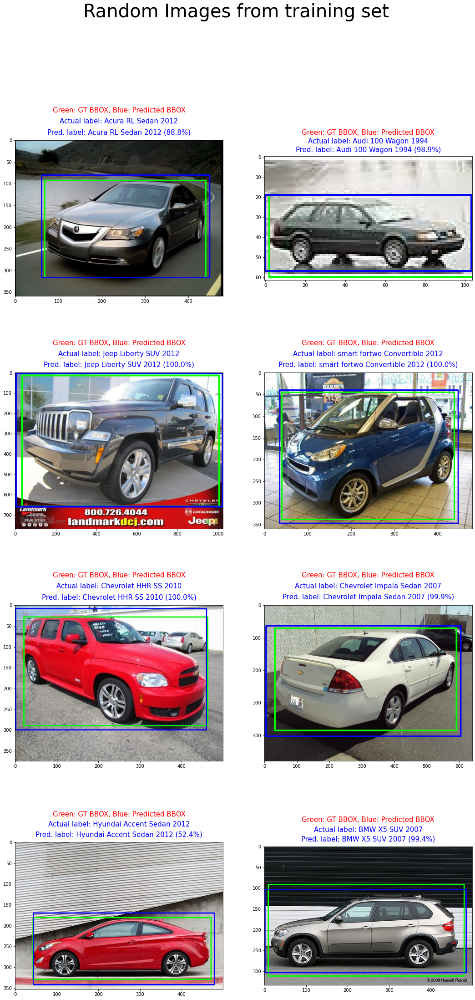

In [27]:
### Use this to plot random images from a particular set
samp_indices = np.random.randint(low = 0, high = train_df.shape[0], size = 8)
fig_title = 'Random Images from training set'

# Predict and plot
predict_and_plot_df(train_df, 'filename', 'class', train_img_path, True, samp_indices,\
                    True, model, mod_inp_shape, ind_class_dict, 2, 9, 9, fig_title)

#### Test set

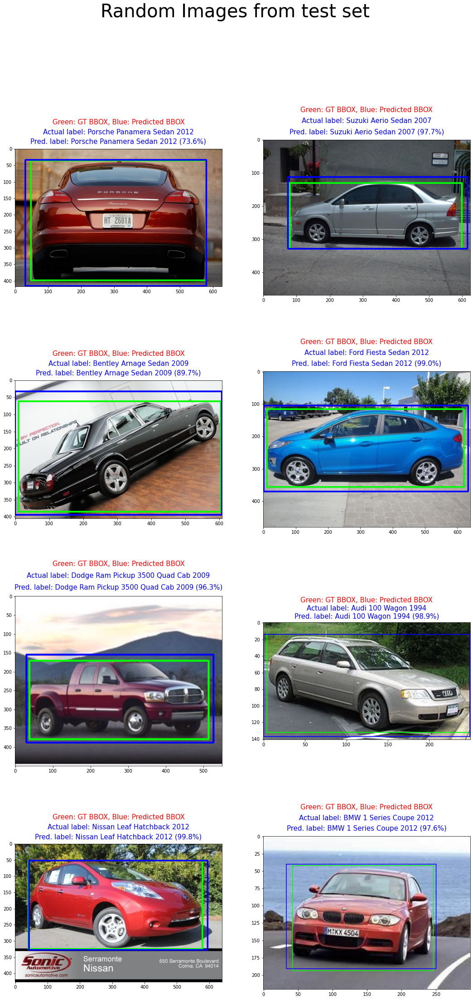

In [28]:
### Use this to plot random images from a particular set
samp_indices = np.random.randint(low = 0, high = test_df.shape[0], size = 8)
fig_title = 'Random Images from test set'

# Predict and plot
predict_and_plot_df(test_df, 'filename', 'class', test_img_path, True, samp_indices,\
                    True, model, mod_inp_shape, ind_class_dict, 2, 9, 9, fig_title)

# Model - 2

### Define file paths

In [30]:
mod_file_pref = "MB_01"
custom_objects = [True, {"IoU": IoU}]
fm_path, hi_path, model = get_model(mod_file_pref, best_model = False, custom_objects = custom_objects,\
                                    print_summary = False)

### Reinstantiate train, val and test generators

No augmentation will be done and shuffling will be turned off. 'preprocessing_function' will be set based on the model that's being loaded.

In [31]:
bm_name = 'DenseNet'
train_generator = batch_generator_from_df(train_df, train_img_path, 'filename', 'class', True,\
                                          mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                          preprocessing_function = preprocess_data)
test_generator = batch_generator_from_df(test_df, test_img_path, 'filename', 'class', True,\
                                         mod_bat_size, mod_inp_shape[0:2], aug = False, shuffle = False,\
                                         preprocessing_function = preprocess_data)

Found 8144 images belonging to 196 classes
Found 8041 images belonging to 196 classes


### Evaluate model on training and test sets

In [32]:
# Define rescale sequence
seq_rescale = iaa.size.Resize(size = mod_inp_shape[0], interpolation = cv2.INTER_CUBIC)

# Evaluate model on training set
res = model.evaluate(x = train_generator, steps = len(train_generator), verbose = 0, return_dict = True)
print("Training set: Overall loss is %0.4f" % res['loss'])
print("Training set: Classification loss is %0.4f" % res['class_op_loss'])
print("Training set: Regression loss is %0.4f" % res['reg_op_loss'])
print("Training set: Classification accuracy is %0.2f %%"\
      % (100 * res['class_op_categorical_accuracy']))
print("Training set: BBOX IoU is %0.2f"\
      % (res['reg_op_IoU']))
print()
# Evaluate model on test set
res = model.evaluate(x = test_generator, steps = len(test_generator), verbose = 0, return_dict = True)
print("Test set: Overall loss is %0.4f" % res['loss'])
print("Test set: Classification loss is %0.4f" % res['class_op_loss'])
print("Test set: Regression loss is %0.4f" % res['reg_op_loss'])
print("Test set: Classification accuracy is %0.2f %%"\
      % (100 * res['class_op_categorical_accuracy']))
print("Test set: BBOX IoU is %0.2f"\
      % (res['reg_op_IoU']))
print()

Training set: Overall loss is 0.7800
Training set: Classification loss is 0.1129
Training set: Regression loss is 0.0007
Training set: Classification accuracy is 96.64 %
Training set: BBOX IoU is 0.89

Test set: Overall loss is 1.5781
Test set: Classification loss is 0.7294
Test set: Regression loss is 0.0008
Test set: Classification accuracy is 80.64 %
Test set: BBOX IoU is 0.88



### Predict and plot

#### Training Set

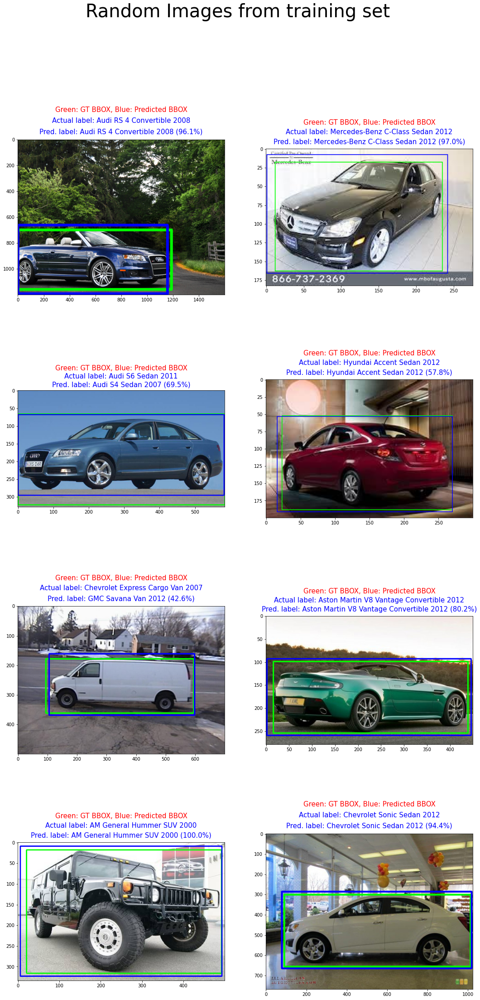

In [33]:
### Use this to plot random images from a particular set
samp_indices = np.random.randint(low = 0, high = train_df.shape[0], size = 8)
fig_title = 'Random Images from training set'

# Predict and plot
predict_and_plot_df(train_df, 'filename', 'class', train_img_path, True, samp_indices,\
                    True, model, mod_inp_shape, ind_class_dict, 2, 9, 9, fig_title)

#### Test set

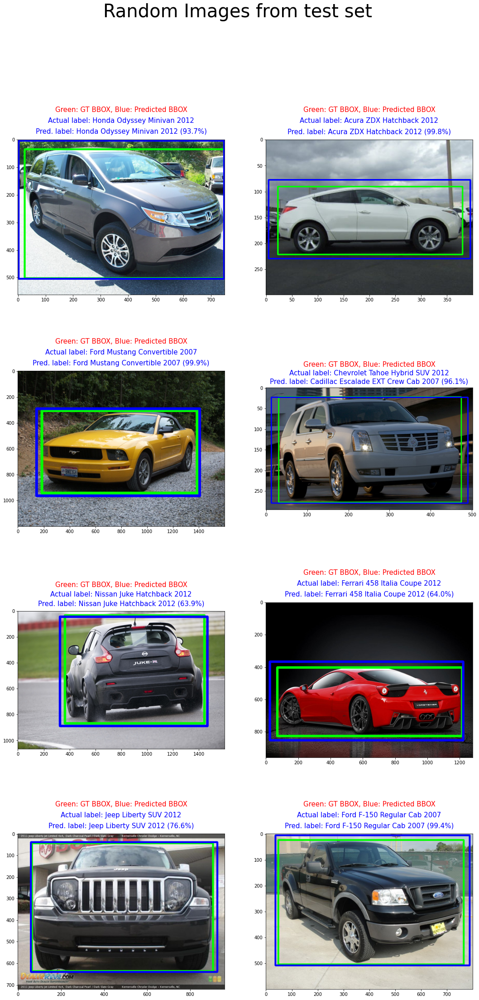

In [34]:
### Use this to plot random images from a particular set
samp_indices = np.random.randint(low = 0, high = test_df.shape[0], size = 8)
fig_title = 'Random Images from test set'

# Predict and plot
predict_and_plot_df(test_df, 'filename', 'class', test_img_path, True, samp_indices,\
                    True, model, mod_inp_shape, ind_class_dict, 2, 9, 9, fig_title)